# Problem

Take an image and apply Gaussian blur like in Figure 1.9. Plot the image contours for increasing values of sigma. What happens? Can you explain why?

Answer: as sigma increases, the number of contours decreases. The colors in the original image are more mixed together as blur increases which leads to fewer color gradations.

[Matplotlib Contour Documentation](https://matplotlib.org/3.3.3/api/_as_gen/matplotlib.axes.Axes.contour.html)

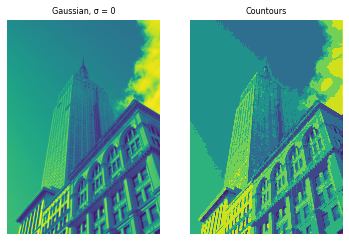

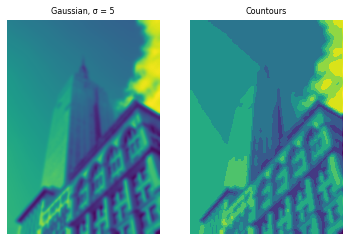

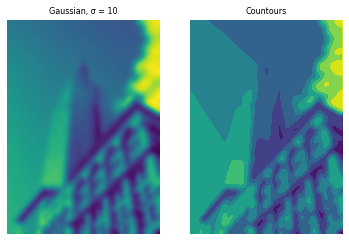

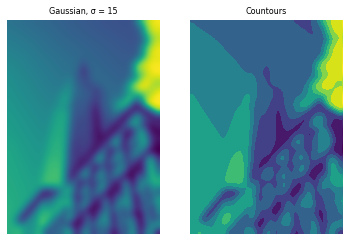

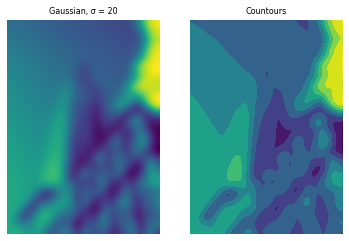

In [1]:
# So that local modules can be imported:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from PIL import Image
from numpy import *
from scipy.ndimage import filters
from matplotlib import pyplot

from lib.plot_gallery import *

EMPIRE_PATH = '../example-images/empire.jpg'
im = array(Image.open(EMPIRE_PATH).convert('L'))

sigmas = list(range(0,25,5))
transform = lambda axis, exhibit: axis.contourf(exhibit.image)

for sigma in sigmas:
    gallery = PlotGallery(columns = 2, title = '')
    
    g_im = filters.gaussian_filter(im,sigma)

    gallery.add_exhibit(Exhibit(g_im, title = 'Gaussian, σ = ' + str(sigma)))
    gallery.add_exhibit(Exhibit(g_im, title = 'Countours', transform = transform))
    gallery.open()


## Fun With Contours

Setting the number of contour levels to a low number creates a bit of a screen print effect.

[Color Maps](https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html)

<Figure size 1800x1200 with 0 Axes>

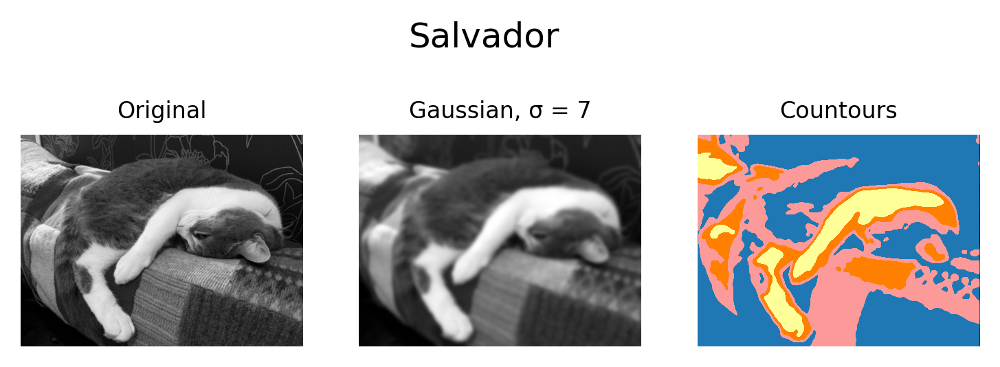

In [29]:
sigma = 7

salvador = Image.open('../example-images/pets/salvador_sleeping.jpg').convert('L')
SIZE_FACTOR = 0.3
salvador = salvador.resize((int(salvador.width * SIZE_FACTOR), int(salvador.height * SIZE_FACTOR)))
salvador

pyplot.set_cmap('gray')

transform = lambda axis, exhibit: axis.contourf(exhibit.image, levels = 3, cmap='Paired')

gallery = PlotGallery(columns = 3, title = 'Salvador', dpi = 300)

g_im = filters.gaussian_filter(salvador,sigma)

gallery.add_exhibit(Exhibit(salvador, title = 'Original'))
gallery.add_exhibit(Exhibit(g_im, title = 'Gaussian, σ = ' + str(sigma)))
gallery.add_exhibit(Exhibit(g_im, title = 'Countours', transform = transform))
gallery.open()